<a href="https://colab.research.google.com/github/melikesahn/yolov5-object-detection/blob/main/yolov5_object_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5  # repostory'i klonluyoruz
%cd yolov5
%pip install -qr requirements.txt # gerekli kütüphaneleri install ediyoruz
%pip install -q roboflow #roboflow u install ediyoruz

import torch
import os
from IPython.display import Image, clear_output  # resimleri görüntülemek için

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 16024, done.
remote: Counting objects: 100% (16/16), done.
remote: Compressing objects: 100% (15/15), done.
remote: Total 16024 (delta 3), reused 4 (delta 1), pack-reused 16008
Receiving objects: 100% (16024/16024), 14.56 MiB | 29.28 MiB/s, done.
Resolving deltas: 100% (11015/11015), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 612.5/612.5 kB 29.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.0/57.0 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.3/155.3 kB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.6/55.6 kB 6.8 MB/s eta 0:00

In [ ]:
from roboflow import Roboflow
api_key = "qBM00Nktj1wXa5S9mGUe"
rf = Roboflow(api_key=api_key, model_format="yolov5", notebook="ultralytics")



In [ ]:
# environment'ı kuruyoruz
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [ ]:
#roboflowdan aldığımız api kodlarını kopyalıyoruz çalıştırınca indirecek
rf = Roboflow(api_key="qBM00Nktj1wXa5S9mGUe")
project = rf.workspace("school-wiubg").project("deneme3-pc88k")
dataset = project.version(5).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/deneme3-5 in yolov5pytorch:: 100%|██████████| 3321/3321 [00:01<00:00, 3292.82it/s]


In [ ]:
%cat {dataset.location}/data.yaml

names:
- aferin
- aljil
- apranax
- arveles
- aspirin
- betasalic
- dikloron
- dolorex
- hametanKrem
- hametanMerhem
- ibucoldC
- majezik
- metpamid
- nexium
- parol
- silverdin
- terbisil
- travazol
- unisom
nc: 19
roboflow:
  license: CC BY 4.0
  project: deneme3-pc88k
  url: https://universe.roboflow.com/school-wiubg/deneme3-pc88k/dataset/5
  version: 5
  workspace: school-wiubg
test: ../test/images
train: /content/datasets/deneme3-5/train/images
val: /content/datasets/deneme3-5/valid/images


In [ ]:
# 416 resmi 16 lık batchler halinde 100 epochda eğitecek saatler sürebilir lütfen sabırlı olun ve aralıklarla ekranın kapanmaması için ekrana basınız.
!python train.py --img 416 --batch 16 --epochs 250 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/datasets/deneme3-5/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=250, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-189-ga453a45 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.0

In [ ]:
# tensorboard'ı başlatıyoruz

#"runs" isimli dosyanın içine kaydediyoruz
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
#test resimlerimizi modele sokuyoruz ve sonuçlar en sonda belirtilen dosya konumuna kaydediliyor
#her farklı resim veya video eklediğinizde en sondaki exp1 exp2 diye artar. runs/detect/exp
!python detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt --img 416 --conf 0.2 --source {dataset.location}/valid/images

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/datasets/deneme3-5/valid/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.2, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-189-ga453a45 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7061368 parameters, 0 gradients, 15.9 GFLOPs
image 1/45 /content/datasets/deneme3-5/valid/images/A-ferin19_jpg.rf.db4fc2b57a4a1a085a3c700e29af09c1.jpg: 416x416 1 aferin, 7.5ms
image 2/45 /content/datasets/deneme3-5/valid/images/A-ferin1_jpg.rf.4719d2c9bbf7ee43ddc7cc49cc86ef47.jpg: 416x416 1 aferin, 7.6ms
image 3/45 /content/datasets/deneme3-5/valid/imag

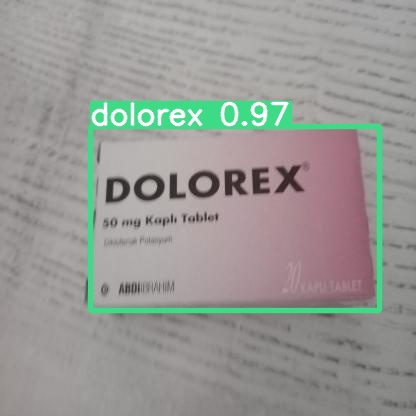

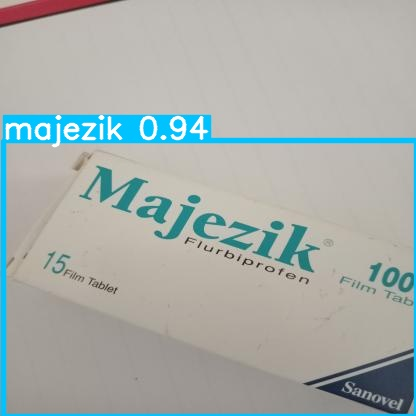

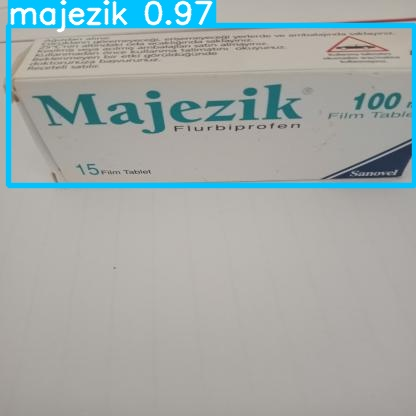

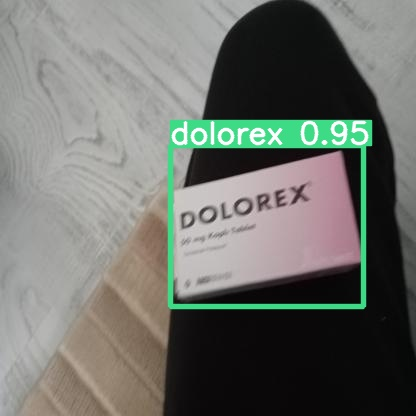

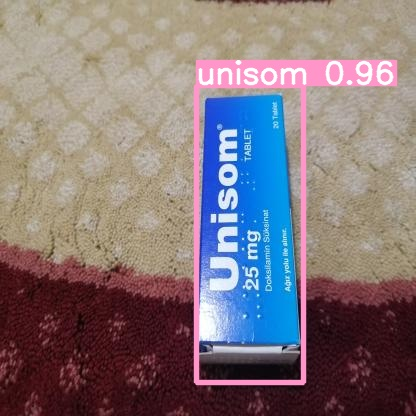

...

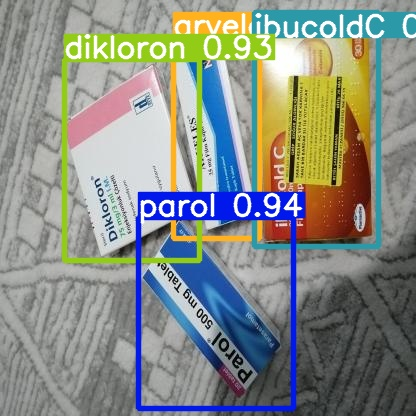

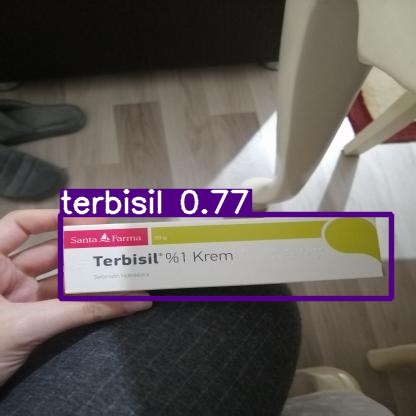

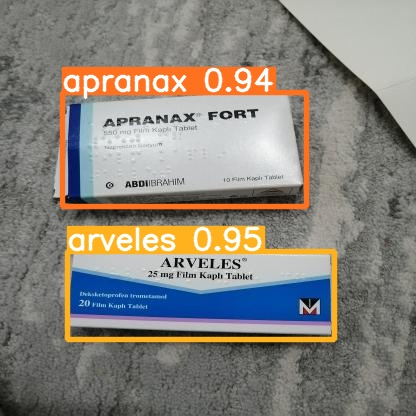

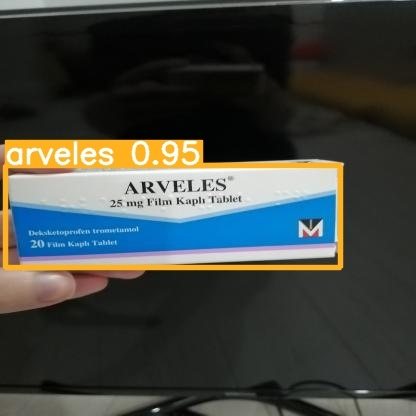

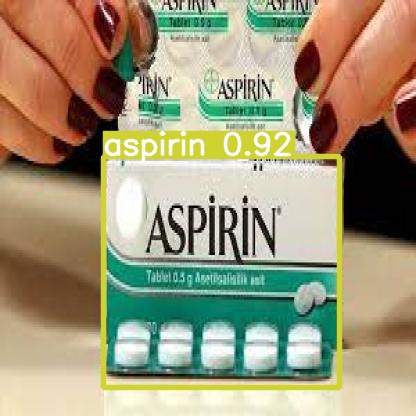

In [ ]:
#modelden çıkmış olan tüm test verilerini ekrana bastırarak sonuçları inceliyoruz.

import glob
from IPython.display import Image, display

i = 0
# lütfen glob.glob un içine doğru dosya konumunu yazınız üst satırda en altta yazan results saved to runs/detects/exp1 veya runs/detects/exp2 veya runs/detects/exp3
for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #dosya uzantısını resimlerinizin formatına göre değiştirin jpg olmak zorunda değil.
    i += 1

    if i < 46:
      display(Image(filename=imageName))
      print("\n")


In [ ]:
#Modelin ağırlıklarını daha sonra kullanmak için bilgisayarımıza kaydediyoruz
from google.colab import files
files.download('/content/yolov5/runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>